## BRIEF INTRODUCTION

Hello, My name is Mohit Gupta. I am from AI & DS. I have been working in the field of machine learning, data science and deep learning from the past 7 - 8 months and I had graped the skills and tech to work upon this easily. I had developed projects Job recomendation and some Machine and Deep learning  applications.

### Recently I also had worked on the **INTEL ONEAPI** on a hackathon conducted by INTEL by himself. In which I had cleared first round and also created an application using **INTEL ONEAPI** and **Machine Learning** for **prototype submission round**.

## Image classification using CNN

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import glob as gb 
import tensorflow as tf
import keras 
import cv2
from keras.callbacks import EarlyStopping
import numpy as np
import pandas as pd
import os

In [5]:
train_path  = '/kaggle/input/intel-image-classification/seg_train/seg_train'
for folder in os.listdir(train_path):
    images=gb.glob(pathname=str(train_path + '/' +folder +'/*.jpg'))
    print(f'for training data, found {len(images)} in folder {folder}')

for training data, found 2512 in folder mountain
for training data, found 2382 in folder street
for training data, found 2191 in folder buildings
for training data, found 2274 in folder sea
for training data, found 2271 in folder forest
for training data, found 2404 in folder glacier


In [6]:
code={'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}
def getname(n):

    for k,v in code.items():
        if v==n:
            return k

In [7]:
train_path  = '/kaggle/input/intel-image-classification/seg_train/seg_train'
x_train=[]
y_train=[]
for folder in os.listdir(train_path):
    images=gb.glob(pathname=str(train_path + '/'+ folder +'/*.jpg'))
    for img in images:
        img=cv2.imread(img)
        img=cv2.resize(img,(100,100))
        x_train.append(img)
        y_train.append(code[folder])

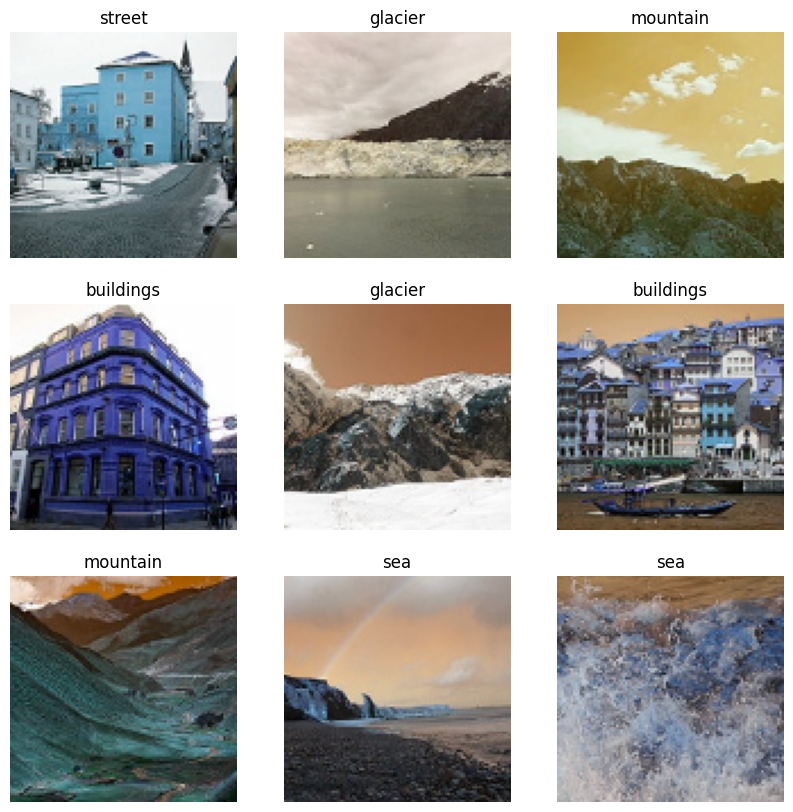

In [8]:
plt.figure(figsize=(10,10))
for i,v in enumerate(np.random.randint(0,len(x_train),9)):
    plt.subplot(3,3,i+1)
    plt.imshow(x_train[v])
    plt.title(getname(y_train[v]))
    plt.axis('off')

In [9]:
test_path  = '/kaggle/input/intel-image-classification/seg_test/seg_test'

x_test=[]
y_test=[]
for folder in os.listdir(test_path):
    images=gb.glob(pathname=str(test_path + '/' + folder +'/*.jpg'))
    for img in images:
        img=cv2.imread(img)
        img=cv2.resize(img,(100,100))
        x_test.append(img)
        y_test.append(code[folder])

In [10]:
pred_path  = '/kaggle/input/intel-image-classification/seg_pred/seg_pred'
x_pred=[]
images=gb.glob(pathname=str(pred_path + '/' +'/*.jpg'))
for img in images:
    img=cv2.imread(img)
    img=cv2.resize(img,(100,100))
    x_pred.append(img)

In [11]:
class_names = ['mountain', 'street', 'buildings', 'sea', 'forest', 'glacier']

In [12]:
NoImg_tr = []
for folder in os.listdir(train_path):
    files = gb.glob(pathname=str(train_path + '//' + folder + '/*.jpg')) #Return a list of paths matching a pathname pattern.
    NoImg_tr.append(len(files))
    print(f'for training data, found {len(files)} in folder {folder}')

for training data, found 2512 in folder mountain
for training data, found 2382 in folder street
for training data, found 2191 in folder buildings
for training data, found 2274 in folder sea
for training data, found 2271 in folder forest
for training data, found 2404 in folder glacier


Text(0.5, 1.0, 'Training Dataset')

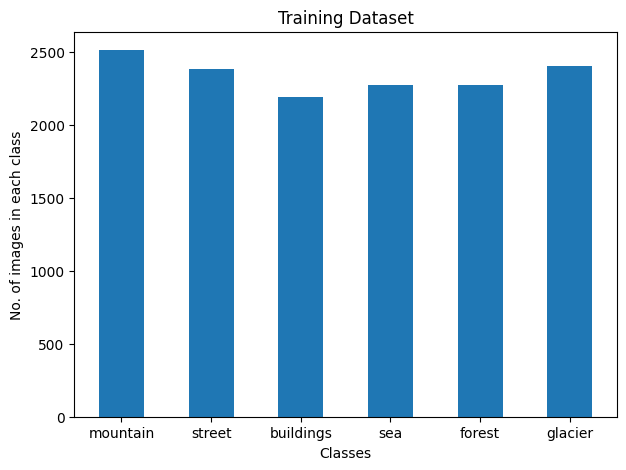

In [13]:
plt.figure(figsize=(7, 5))
plt.bar(class_names, NoImg_tr, width=0.5)
plt.xlabel('Classes')
plt.ylabel('No. of images in each class')
plt.title('Training Dataset')

In [14]:
NoImg_ts = []
for folder in os.listdir(test_path):
    files = gb.glob(pathname=str(test_path + '//' + folder + '/*.jpg'))
    NoImg_ts.append(len(files))
    print(f'for testing data, found {len(files)} in folder {folder}')

for testing data, found 525 in folder mountain
for testing data, found 501 in folder street
for testing data, found 437 in folder buildings
for testing data, found 510 in folder sea
for testing data, found 474 in folder forest
for testing data, found 553 in folder glacier


Text(0.5, 1.0, 'Testing Dataset')

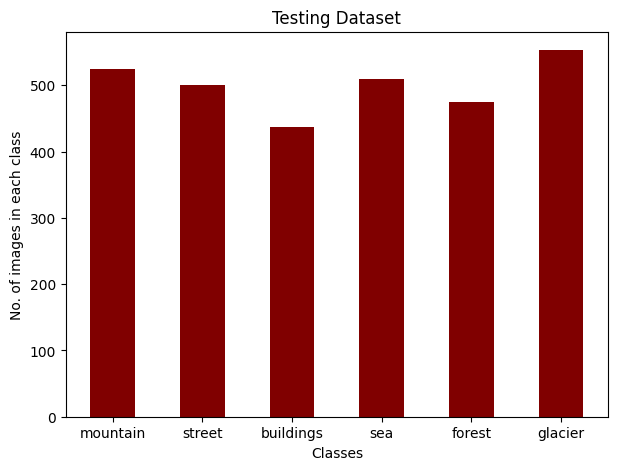

In [15]:
plt.figure(figsize=(7, 5))
plt.bar(class_names, NoImg_ts, width=0.5, color='maroon')
plt.xlabel('Classes')
plt.ylabel('No. of images in each class')
plt.title('Testing Dataset')

In [16]:
files = gb.glob(pathname= str(pred_path + '/*.jpg'))
print(f'for prediction data found {len(files)}')

for prediction data found 7301


In [17]:
# trian data
size = []
for folder in os.listdir(train_path):
    files = gb.glob(pathname=str(train_path + '//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
print(pd.Series(size).value_counts()) # Print a Series containing counts of unique values.

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(143, 150, 3)        2
(108, 150, 3)        2
(146, 150, 3)        2
(142, 150, 3)        2
(123, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(144, 150, 3)        2
(81, 150, 3)         1
(149, 150, 3)        1
(119, 150, 3)        1
(76, 150, 3)         1
(120, 150, 3)        1
(97, 150, 3)         1
(105, 150, 3)        1
(141, 150, 3)        1
(110, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(145, 150, 3)        1
(140, 150, 3)        1
(124, 150, 3)        1
(103, 150, 3)        1
(100, 150, 3)        1
(131, 150, 3)        1
(147, 150, 3)        1
(102, 150, 3)        1
Name: count, dtype: int64


In [18]:
# test data
size = []
for folder in os.listdir(test_path):
    files = gb.glob(pathname=str(test_path + '//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
print(pd.Series(size).value_counts()) 

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
Name: count, dtype: int64


In [19]:
# prediction data
size = []
files = gb.glob(pathname=str(pred_path + '/*.jpg'))
for file in files:
    image = plt.imread(file)
    size.append(image.shape)
print(pd.Series(size).value_counts())

(150, 150, 3)    7288
(139, 150, 3)       1
(108, 150, 3)       1
(129, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(144, 150, 3)       1
(133, 150, 3)       1
(112, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(126, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
Name: count, dtype: int64


In [20]:
class_names_label = {class_names:i for i,class_names in enumerate(class_names)}
class_names_label

{'mountain': 0,
 'street': 1,
 'buildings': 2,
 'sea': 3,
 'forest': 4,
 'glacier': 5}

In [21]:
x_train=np.array(x_train)
x_test=np.array(x_test)

y_train=np.array(y_train)
y_test=np.array(y_test)

x_pred=np.array(x_pred)

In [22]:
print(f'X_train shape  is {x_train.shape}')
print(f'X_test shape  is {x_test.shape}')
print(f'X_pred shape  is {x_pred.shape}')
print(f'y_train shape  is {x_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034, 100, 100, 3)
y_test shape  is (3000,)


In [23]:
def get_label(n):  
    for key, value in class_names_label.items():
        if n == value:
            return key

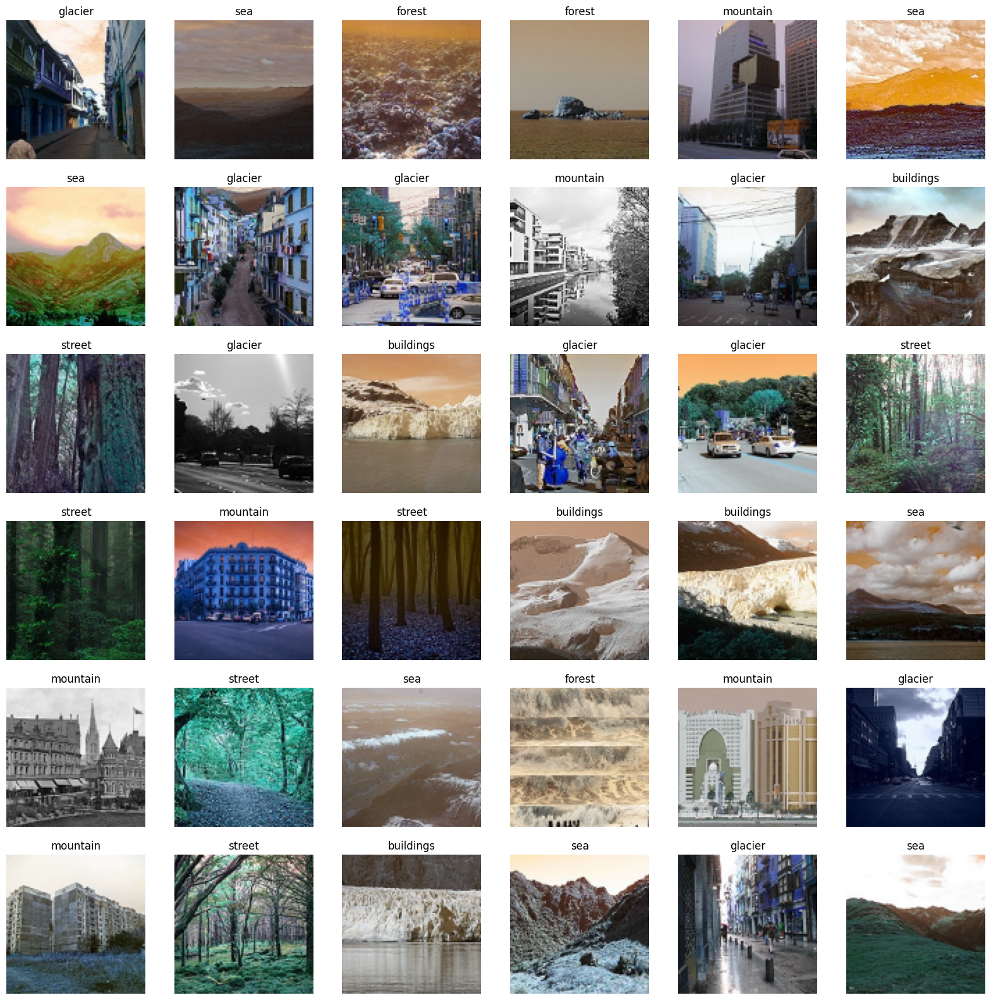

In [24]:
# Let's show some random pictures in X_train
plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_train), 36))):  # n -> index , i -> random numbers
    plt.subplot(6, 6, n+1)
    plt.imshow(x_train[i])
    plt.axis('off')
    plt.title(get_label(y_train[i]))

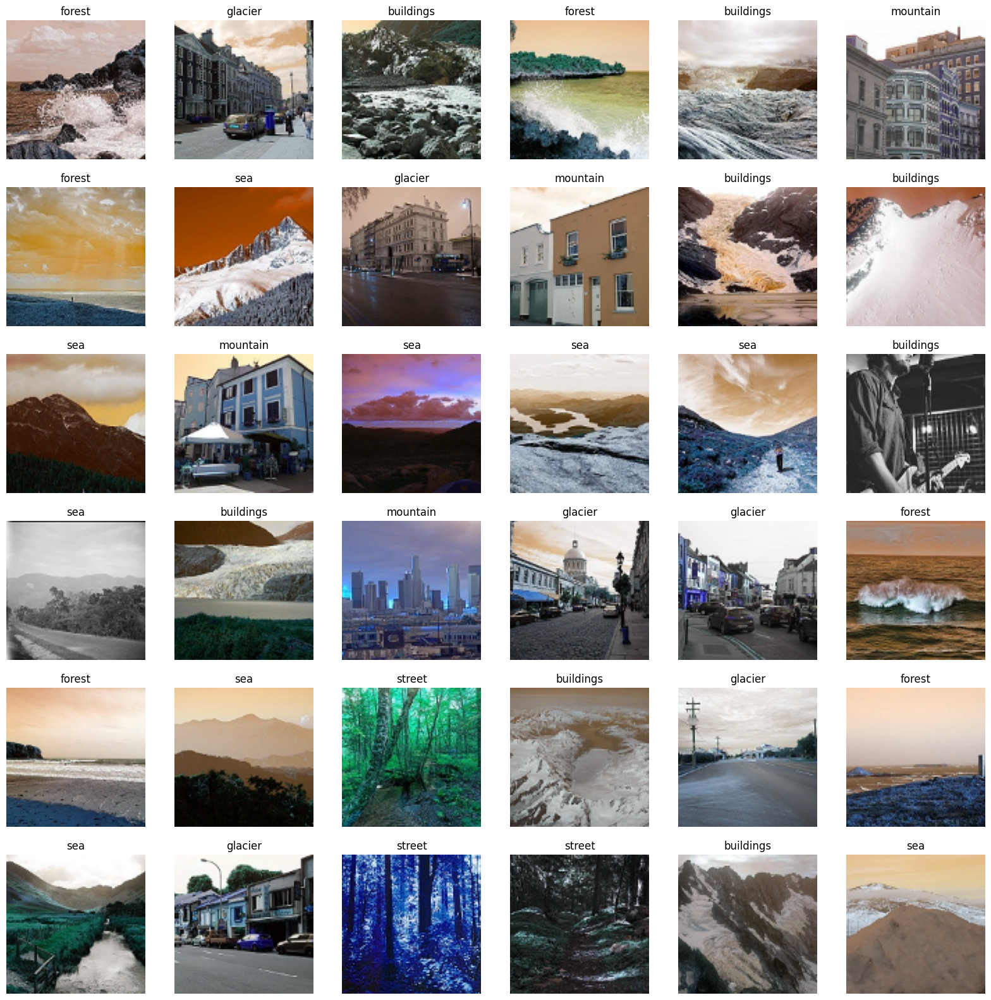

In [25]:
# Let's show some random pictures in X_test
plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_test), 36))): # n -> index , i -> random numbers
    plt.subplot(6, 6, n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title(get_label(y_test[i]))

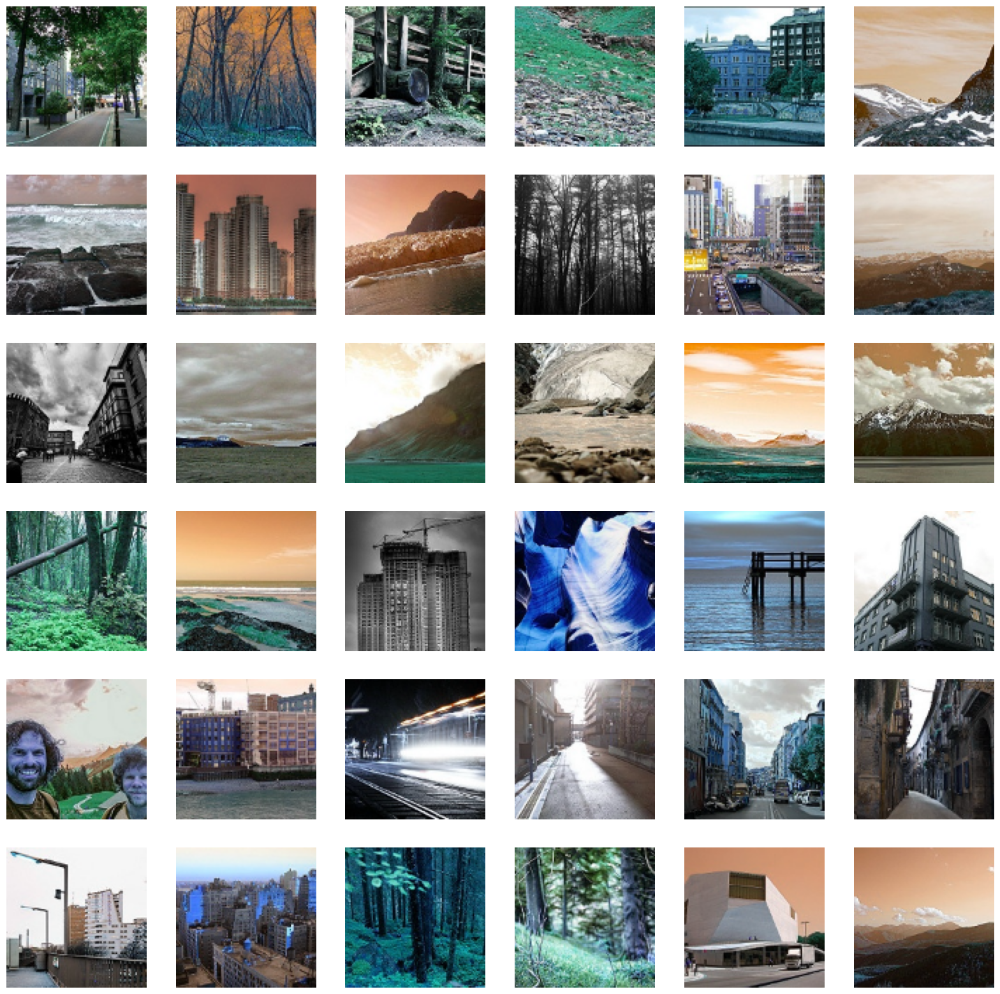

In [26]:
# Let's show some random pictures in X_pred
plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_pred), 36))):
    plt.subplot(6, 6, n+1)
    plt.imshow(x_pred[i])
    plt.axis('off')

In [27]:
model=keras.models.Sequential(
[
    keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(100,100,3)),
    keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
    keras.layers.MaxPool2D(4,4),
    keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),
    keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),
    keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
    keras.layers.MaxPool2D(4,4),
    keras.layers.Flatten(),
    keras.layers.Dense(120,activation='relu'),
    keras.layers.Dense(100,activation='relu'),
    keras.layers.Dense(50,activation='relu'),
    keras.layers.Dense( 6,activation='softmax')
])

In [28]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                                        

In [29]:
es = EarlyStopping(monitor='val_loss', mode='min',patience=3)
model.compile(optimizer=tf.keras.optimizers.Adam() ,loss='SparseCategoricalCrossentropy' , metrics=['accuracy'])
final_model=model.fit(x_train,y_train,validation_data=(x_test,y_test),epochs=10,batch_size=130,callbacks=[es],verbose=1)

Epoch 1/10
108/108 [==============================] - 1860s 17s/step - loss: 1.7192 - accuracy: 0.4357 - val_loss: 1.0684 - val_accuracy: 0.5657
Epoch 2/10
108/108 [==============================] - 1883s 17s/step - loss: 0.9773 - accuracy: 0.6051 - val_loss: 0.9078 - val_accuracy: 0.6193
Epoch 3/10
108/108 [==============================] - 1869s 17s/step - loss: 0.8577 - accuracy: 0.6707 - val_loss: 0.7751 - val_accuracy: 0.7220
Epoch 4/10
108/108 [==============================] - 1866s 17s/step - loss: 0.7233 - accuracy: 0.7324 - val_loss: 0.7028 - val_accuracy: 0.7347
Epoch 5/10
108/108 [==============================] - 1857s 17s/step - loss: 0.6347 - accuracy: 0.7720 - val_loss: 0.6195 - val_accuracy: 0.7717
Epoch 6/10
108/108 [==============================] - 1870s 17s/step - loss: 0.5800 - accuracy: 0.7946 - val_loss: 0.5792 - val_accuracy: 0.8013
Epoch 7/10
108/108 [==============================] - 1878s 17s/step - loss: 0.5274 - accuracy: 0.8117 - val_loss: 0.5546 - val_ac

In [30]:
model.compile(optimizer='adam' , loss='sparse_categorical_crossentropy',metrics=['accuracy'])
final_model=model.fit(x_train,y_train,epochs=2,batch_size=250,verbose=1)

Epoch 1/2
57/57 [==============================] - 1792s 31s/step - loss: 0.5791 - accuracy: 0.8035
Epoch 2/2
57/57 [==============================] - 1791s 31s/step - loss: 0.3740 - accuracy: 0.8667


In [31]:
loss,accuracy=model.evaluate(x_test,y_test)
print(f'loss= {loss}')
print(f'accuracy= {accuracy}')

94/94 [==============================] - 112s 1s/step - loss: 0.6324 - accuracy: 0.7987
loss= 0.632362961769104
accuracy= 0.7986666560173035


In [32]:
y_probs=model.predict(x_test)
y_pred=y_probs.argmax(axis=1)
y_percent=np.amax(y_probs,axis=1)
# y_pred[:100]

94/94 [==============================] - 113s 1s/step


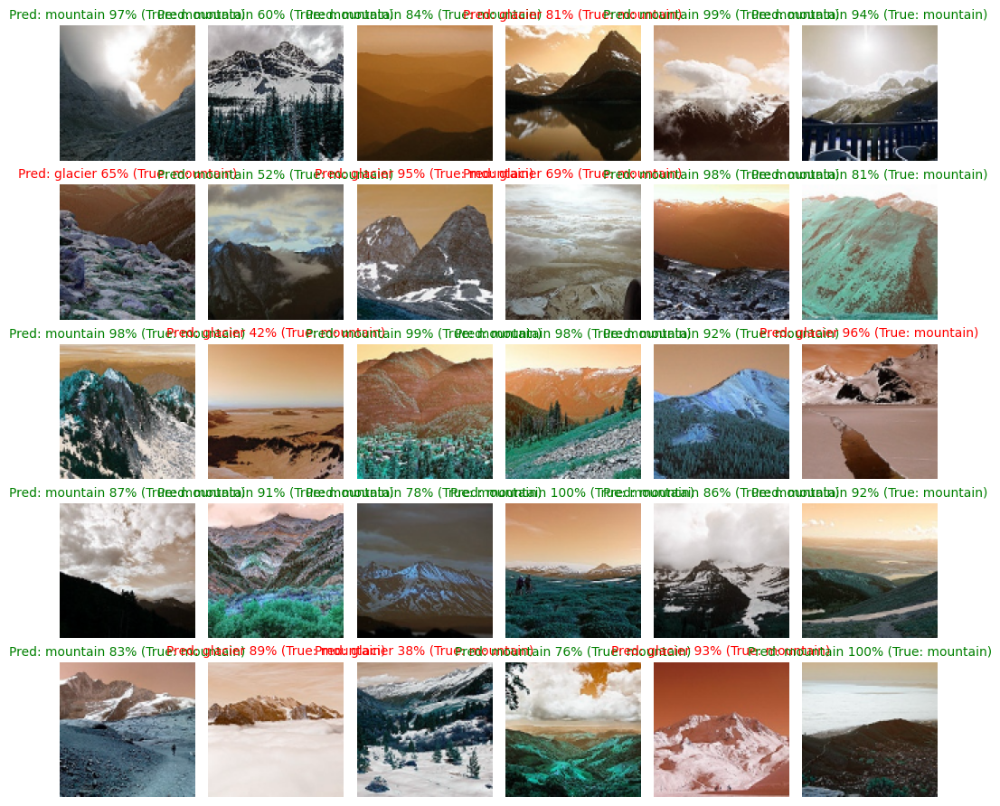

In [33]:
plt.figure(figsize=(10,9))
plotnumber=1

for i in range(1,31):
    if plotnumber <=30:
        ax=plt.subplot(5,6,plotnumber)
        plt.imshow(x_test[i],cmap='binary')
        plt.axis('off')
        plt.title('Pred: ' + getname(y_pred[i]) +' '+ str(round(y_percent[i]*100)) +'% (True: ' + getname(y_test[i]) + ')',fontdict={'fontsize':10 , 'color':('green' if y_pred[i]==y_test[i] else 'red')})
        plotnumber+=1
plt.tight_layout()
plt.show()